In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go

In [2]:
# Set the default template globally
pio.templates.default = "plotly_white"

#Reads the dataframe from memory
df = pd.read_csv('../data/processed/rail_accident_pop.csv', low_memory = False)
#Display all columns
pd.set_option('display.max_columns', None)
#Display the first few rows
df.head()

,Reporting Railroad Code,Reporting Railroad Name,Year,Accident Number,PDF Link,Accident Year,Accident Month,Other Railroad Code,Other Railroad Name,Other Accident Number,Other Accident Year,Other Accident Month,Maintenance Railroad Code,Maintenance Railroad Name,Maintenance Accident Number,Maintenance Accident Year,Maintenance Accident Month,Grade Crossing ID,Day,Date,Time,Accident Type Code,Accident Type,Hazmat Cars,Hazmat Cars Damaged,Hazmat Released Cars,Persons Evacuated,Subdivision,Division Code,Division,Station,Milepost,State Code,State Abbreviation,State Name,County Code,County Name,District,Temperature,Visibility Code,Visibility,Weather Condition Code,Weather Condition,Track Type Code,Track Type,Track Name,Track Class,Track Density,Train Direction Code,Train Direction,Equipment Type Code,Equipment Type,Equipment Attended,Train Number,Train Speed,Recorded Estimated Speed,Maximum Speed,Gross Tonnage,Signalization Code,Signalization,Method of Operation Code,Method of Operation,Adjunct Code 1,Adjunct Name 1,Adjunct Code 2,Adjunct Name 2,Adjunct Code 3,Adjunct Name 3,Remote Control Locomotive Code,Remote Control Locomotive,First Car Initials,First Car Number,First Car Position,First Car Loaded,Causing Car Initials,Causing Car Number,Causing Car Position,Causing Car Loaded,Positive Alcohol Tests,Positive Drug Tests,Passengers Transported,Head End Locomotives,Mid Train Manual Locomotives,Mid Train Remote Locomotives,Rear End Manual Locomotives,Rear End Remote Locomotives,Derailed Head End Locomotives,Derailed Mid Train Manual Locomotives,Derailed Mid Train Remote Locomotives,Derailed Rear End Manual Locomotives,Derailed Rear End Remote Locomotives,Loaded Freight Cars,Loaded Passenger Cars,Empty Freight Cars,Empty Passenger Cars,Cabooses,Derailed Loaded Freight Cars,Derailed Loaded Passenger Cars,Derailed Empty Freight Cars,Derailed Empty Passenger Cars,Derailed Cabooses,Equipment Damage Cost,Track Damage Cost,Total Damage Cost,Primary Accident Cause Code,Primary Accident Cause,Contributing Accident Cause Code,Contributing Accident Cause,Accident Cause Code,Accident Cause,Engineers On Duty,Firemen On Duty,Conductors On Duty,Brakemen On Duty,Hours Engineers On Duty,Minutes Engineers On Duty,Hours Conductors On Duty,Minutes Conductors On Duty,Railroad Employees Killed,Railroad Employees Injured,Passengers Killed,Passengers Injured,Others Killed,Others Injured,Reporting Railroad Fatalities for 55a,Reporting Railroad Injuries for 55a,Total Persons Killed,Total Persons Injured,Total Killed Form 54,Total Injured Form 54,Special Study 1,Special Study 2,Latitude,Longitude,Narrative,Joint Track Type,Joint Track Class,Class Code,Class,Joint CD,Incident Key,Report Key,Reporting Railroad Class,Reporting Railroad SMT Grouping,Reporting Parent Railroad Code,Reporting Parent Railroad Name,Reporting Railroad Holding Company,Reporting Railroad Individual Class,Reporting Railroad Passenger,Reporting Railroad Commuter,Reporting Railroad Switching Terminal,Reporting Railroad Tourist,Reporting Railroad Freight,Reporting Railroad Short Line,Location,State Code FIPS,County Code FIPS,FIPS,Description,Population_2020,RUCC_2023,Label,Location_Class,Cause_Category
0,BNSF,BNSF Railway Company,2013,NW0813104,https://safetydata.fra.dot.gov/Officeofsafety/...,13,8,NaN,NaN,NaN,NaN,NaN,PTOZ,Port Of Tacoma,INDUSTRY,13.0,8.0,NaN,10,08/10/2013,4:45 PM,1.0,Derailment,0,0,0,0,SYSTEM,NaN,NaN,TACOMA,NaN,53,WA,WASHINGTON,53.0,PIERCE,8,71,2.0,Day,1.0,Clear,2.0,Yard,30,1,NaN,3,East,1,Freight Train,Yes,BOIG,4.0,Estimated,4.0,"1,665",2.0,Not Signaled,NaN,Other Than Main Track,NaN,NaN,NaN,NaN,NaN,NaN,0,Not a remotely controlled operation,BNSF,004665,3.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,No,4,0,0,0,0,1,0,0,0,0,0,0,20,0,0,0,0,0,0,0,"42,000",0,"42,000",T314,Switch point worn or broken,NaN,NaN,T314,Switch point worn or broken,2.0,0.0,1.0,0.0,6.0,35.0,6.0,35.0,0,0,0,0,0,0,0,0,0,0,0,0,OTH,NaN,47.248398,-122.388591,B-OIGSEA5-08 DERAILED 1 LOCOMOTIVE IN TRACK 30...,Yard,1,1,1,1,PTOZIND

| Code | Category | Examples |
|------|----------|----------|
| H | Human Factors | Operator error, procedure violations, switching mistakes |
| M | Mechanical & Electrical | Equipment failures, brake defects, mechanical breakdowns |
| T | Track | Track geometry defects, rail defects, track maintenance issues |
| S | Signal | Signal system failures, communication errors |
| E | Miscellaneous/Environmental | Weather, vandalism, other external factors |

In [3]:
df['Date'] = pd.to_datetime(df.loc[:, 'Date'])
df['Time'] = pd.to_datetime(df.loc[:, 'Time'])

df['Hour'] = df['Time'].dt.hour
df['Persons Evacuated'] = df['Persons Evacuated'].str.replace(',', '').astype(int)
df['Gross Tonnage'] = df['Gross Tonnage'].str.replace(',', '').astype(int)
df['Equipment Damage Cost'] = df.loc[:, 'Equipment Damage Cost'].str.replace(',', '').astype(float)
df['Track Damage Cost'] = df.loc[:, 'Track Damage Cost'].str.replace(',', '').astype(float)
df['Total Damage Cost'] = df.loc[:, 'Total Damage Cost'].str.replace(',', '').astype(float)

C:\Users\albet\AppData\Local\Temp\ipykernel_11708\313596752.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Time'] = pd.to_datetime(df.loc[:, 'Time'])


In [4]:
display(pd.pivot_table(df, index = 'Cause_Category', columns = 'Location_Class', values = 'Total Damage Cost',
              margins = True, aggfunc = 'mean').round(2))

Location_Class,Rural,Urban,All
Cause_Category,,,
E,298918.08,171076.99,210690.21
H,168036.67,122839.77,131508.45
M,311084.39,121467.63,171612.45
S,125834.00,74012.28,82440.03
T,349714.11,162061.36,215064.42
All,271583.46,133970.25,167294.46


In [5]:
cost_by_year = df.groupby('Year')['Total Damage Cost'].median().reset_index()

fig = px.line(cost_by_year, x = 'Year', y = 'Total Damage Cost')
fig.show()

In [6]:
features = [
            'Reporting Railroad Code', 'Accident Month', 'Hour', 
            'Accident Type Code', 'Hazmat Cars', 'Hazmat Cars Damaged', 'Hazmat Released Cars', 'Persons Evacuated', 'State Code', 
            'Temperature', 'Visibility Code', 'Weather Condition Code', 'Track Type Code', 'Track Class', 'Train Direction Code', 
            'Equipment Type Code', 'Train Speed', 'Maximum Speed', 'Gross Tonnage', 'Signalization Code', 'Causing Car Position',
            'Head End Locomotives', 'Mid Train Manual Locomotives', 'Mid Train Remote Locomotives', 'Rear End Manual Locomotives', 
            'Rear End Remote Locomotives', 'Derailed Head End Locomotives', 'Derailed Mid Train Manual Locomotives',
            'Derailed Mid Train Remote Locomotives', 'Derailed Rear End Manual Locomotives', 'Derailed Rear End Remote Locomotives',
            'Derailed Mid Train Remote Locomotives', 'Derailed Rear End Manual Locomotives', 'Derailed Rear End Remote Locomotives',
            'Loaded Freight Cars', 'Loaded Passenger Cars', 'Empty Freight Cars', 'Empty Passenger Cars', 'Cabooses',
            'Derailed Loaded Freight Cars', 'Derailed Loaded Passenger Cars', 'Derailed Empty Freight Cars', 
            'Derailed Empty Passenger Cars', 'Derailed Cabooses', 'Accident Cause Code', 
            'Engineers On Duty', 'Firemen On Duty', 'Conductors On Duty', 'Brakemen On Duty',
            'Railroad Employees Killed', 'Railroad Employees Injured', 'Passengers Killed', 'Passengers Injured', 
            'Others Killed', 'Others Injured', 'Total Persons Killed', 'Total Persons Injured',
            'Joint Track Class', 'Class Code', 'Class', 'FIPS', 'Population_2020', 'RUCC_2023', 'Location_Class', 'Cause_Category'
           ]

#targets = ['Equipment Damage Cost', 'Track Damage Cost', 'Total Damage Cost']
targets = ['Total Damage Cost']
#Consider adding: Equipment Attended (bool), Passengers Transported (bool), Hours/Minutes Conductors/Engineers On Duty

corr_df = df[features + targets]
corr_df = corr_df.dropna()

#Factorizes all non-numeric columns
corr_df.loc[:, list(corr_df.dtypes == 'object')] = corr_df.loc[:, list(corr_df.dtypes == 'object')].apply(lambda x: pd.factorize(x)[0])

corr_df.head()

#corr_df.to_csv('../data/processed/factorized_data.csv')

,Reporting Railroad Code,Accident Month,Hour,Accident Type Code,Hazmat Cars,Hazmat Cars Damaged,Hazmat Released Cars,Persons Evacuated,State Code,Temperature,Visibility Code,Weather Condition Code,Track Type Code,Track Class,Train Direction Code,Equipment Type Code,Train Speed,Maximum Speed,Gross Tonnage,Signalization Code,Causing Car Position,Head End Locomotives,Mid Train Manual Locomotives,Mid Train Remote Locomotives,Rear End Manual Locomotives,Rear End Remote Locomotives,Derailed Head End Locomotives,Derailed Mid Train Manual Locomotives,Derailed Mid Train Remote Locomotives,Derailed Rear End Manual Locomotives,Derailed Rear End Remote Locomotives,Derailed Mid Train Remote Locomotives,Derailed Rear End Manual Locomotives,Derailed Rear End Remote Locomotives,Loaded Freight Cars,Loaded Passenger Cars,Empty Freight Cars,Empty Passenger Cars,Cabooses,Derailed Loaded Freight Cars,Derailed Loaded Passenger Cars,Derailed Empty Freight Cars,Derailed Empty Passenger Cars,Derailed Cabooses,Accident Cause Code,Engineers On Duty,Firemen On Duty,Conductors On Duty,Brakemen On Duty,Railroad Employees Killed,Railroad Employees Injured,Passengers Killed,Passengers Injured,Others Killed,Others Injured,Total Persons Killed,Total Persons Injured,Joint Track Class,Class Code,Class,FIPS,Population_2020,RUCC_2023,Location_Class,Cause_Category,Total Damage Cost
0,0,8,16,1.0,0,0,0,0,53,71,2.0,1.0,2.0,0,0,0,4.0,4.0,1665,2.0,0.0,4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,20,0,0,0,0,0,0,0,0,2.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,53053,921130.0,1,0,0,42000.0
1,1,6,21,1.0,1,0,0,0,21,70,4.0,1.0,1.0,1,1,0,32.0,32.0,8691,1.0,0.0,3,0,0,0,0,0,0,0,0,0,0,0,0,82,0,100,0,0,0,0,1,0,0,1,1.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,1,0,0,21015,135968.0,1,0,1,33752.0
2,1,7,7,12.0,0,0,0,0,47,76,1.0,1.0,2.0,0,2,1,7.0,7.0,0,2.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,47037,715884.0,1,0,1,26042.0
3,1,10,18,1.0,0,0,0,0,45,71,2.0,1.0,2.0,0,2,2,6.0,6.0,0,2.0,0.0,2,0,0,0,0,0,0,0,0,0,0,0,0,29,0,0,0,0,5,0,0,0,0,3,1.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,45047,69351.0,4,1,2,87077.0
4,2,3,13,1.0,0,0,0,161,12,85,2.0,1.0,1.0,2,2,3,17.0,17.0,0,1.0,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,1,0,0,0,4,1.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,2,1,1,12099,1492191.0,1,0,3,27339.0


In [7]:
factor_keys = df.loc[:, list(df.dtypes == 'object')].apply(lambda x: pd.factorize(x)[1])
cause_categories = factor_keys['Cause_Category']

In [8]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_data = pd.DataFrame()
vif_data['Feature'] = corr_df.columns

corr_df = corr_df.astype('float')
vif_data['VIF'] = [variance_inflation_factor(corr_df.values, i) for i in range(len(corr_df.columns))]

vif_data.nlargest(25, 'VIF')

C:\Users\albet\anaconda3\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide



,Feature,VIF
28,Derailed Mid Train Remote Locomotives,inf
29,Derailed Rear End Manual Locomotives,inf
30,Derailed Rear End Remote Locomotives,inf
31,Derailed Mid Train Remote Locomotives,inf
32,Derailed Rear End Manual Locomotives,inf
33,Derailed Rear End Remote Locomotives,inf
58,Class Code,inf
59,Class,inf
60,FIPS,1.085197e+05
8,State Code,1.082103e+05


In [9]:
corr_features = {}

for i in range(5):
    print(cause_categories[i])
    corr_features[cause_categories[i]] = corr_df[corr_df['Cause_Category'] == i].corr()['Total Damage Cost'].nlargest(6)
    display(corr_features[cause_categories[i]][1:])
    print()

T


Derailed Loaded Freight Cars    0.544316
Passengers Killed               0.473038
Passengers Injured              0.452416
Maximum Speed                   0.435206
Train Speed                     0.425841
Name: Total Damage Cost, dtype: float64


M


Derailed Loaded Freight Cars     0.285816
Persons Evacuated                0.208663
Hazmat Cars Damaged              0.125866
Derailed Head End Locomotives    0.120037
Derailed Empty Freight Cars      0.112559
Name: Total Damage Cost, dtype: float64


H


Total Persons Killed              0.686923
Total Persons Injured             0.619981
Passengers Injured                0.548166
Passengers Killed                 0.525057
Derailed Loaded Passenger Cars    0.522602
Name: Total Damage Cost, dtype: float64


E


Derailed Loaded Freight Cars    0.665806
Hazmat Released Cars            0.384632
Hazmat Cars Damaged             0.329969
Loaded Freight Cars             0.276738
Gross Tonnage                   0.262204
Name: Total Damage Cost, dtype: float64


S


Total Persons Injured             0.593153
Passengers Injured                0.526532
Derailed Loaded Passenger Cars    0.492655
Maximum Speed                     0.478226
Train Speed                       0.393806
Name: Total Damage Cost, dtype: float64

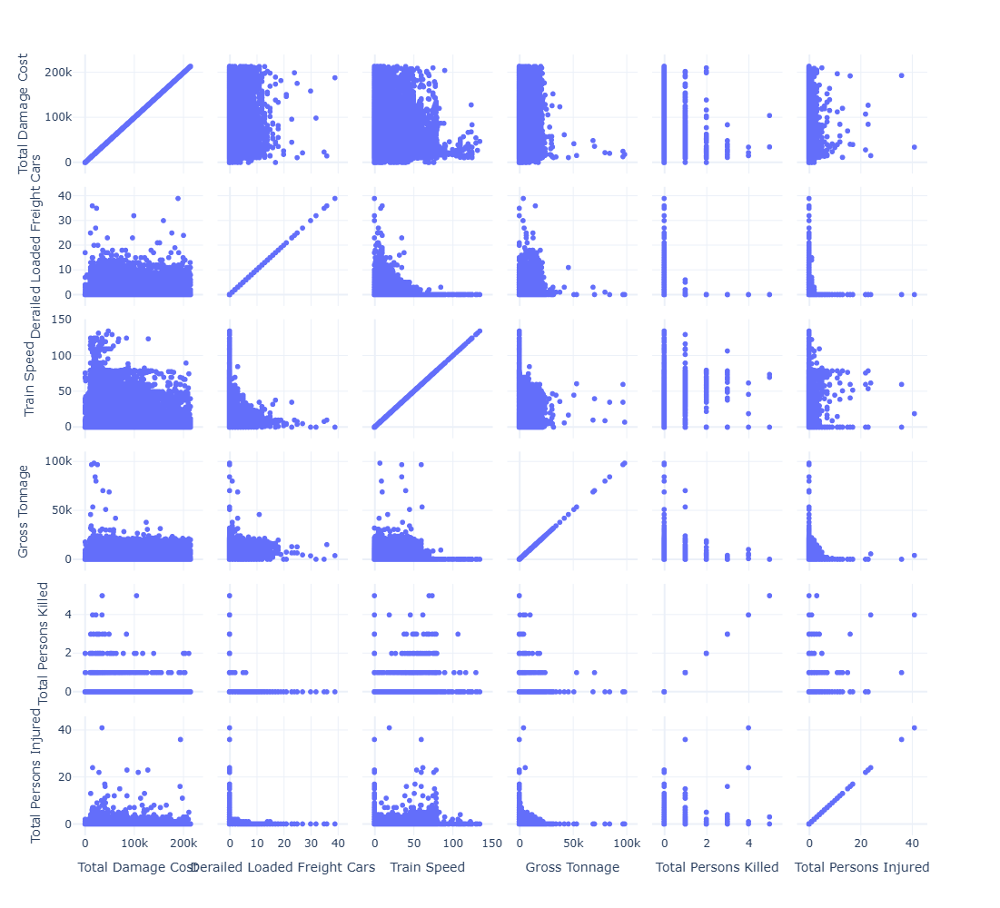

In [78]:
cost_iqr = df['Total Damage Cost'].quantile(0.75) - df['Total Damage Cost'].quantile(0.25)

cost_upper_bound = df['Total Damage Cost'].quantile(0.75) + (1.5 * cost_iqr)
cost_lower_bound = df['Total Damage Cost'].quantile(0.25) - (1.5 * cost_iqr)

fig = px.scatter_matrix(df.loc[df['Total Damage Cost'] < cost_upper_bound, 
                ['Total Damage Cost', 'Derailed Loaded Freight Cars', 'Train Speed', 'Gross Tonnage', 'Total Persons Killed', 'Total Persons Injured']])

fig.update_layout(
    height = 1000,
    width = 1000
)

fig.show()

In [11]:
df['Total Empty Cars'] = df['Empty Freight Cars'] + df['Empty Passenger Cars']
df['Total Engine Cars'] = df[['Head End Locomotives', 'Mid Train Manual Locomotives', 'Mid Train Remote Locomotives', \
                              'Rear End Manual Locomotives', 'Rear End Remote Locomotives']].sum(axis = 1)

df['Total Loaded Cars'] = df['Loaded Freight Cars'] + df['Loaded Passenger Cars']

df['Derailed Empty'] = df['Derailed Empty Freight Cars'] + df['Derailed Empty Passenger Cars']
df['Derailed Loaded'] = df['Derailed Loaded Freight Cars'] + df['Derailed Loaded Passenger Cars']
df['Derailed Locomotives'] = df[['Derailed Head End Locomotives', 'Derailed Mid Train Manual Locomotives', 
                'Derailed Mid Train Remote Locomotives', 'Derailed Rear End Manual Locomotives', 'Derailed Rear End Remote Locomotives']].sum(axis = 1)

In [12]:
fig = px.histogram(df.loc[df['Total Damage Cost'] < cost_upper_bound, 'Total Damage Cost'], title = 'Damage Cost Distribution')

fig.show()

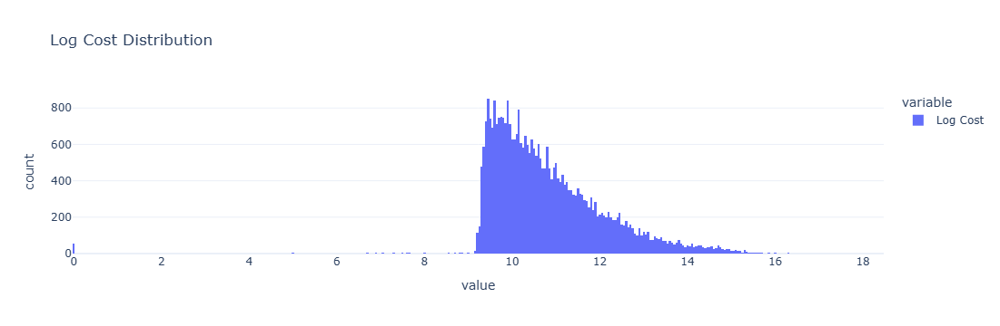

In [13]:
df['Log Cost'] = np.log1p(df['Total Damage Cost'])

fig = px.histogram(df['Log Cost'], title = 'Log Cost Distribution')
fig.show()

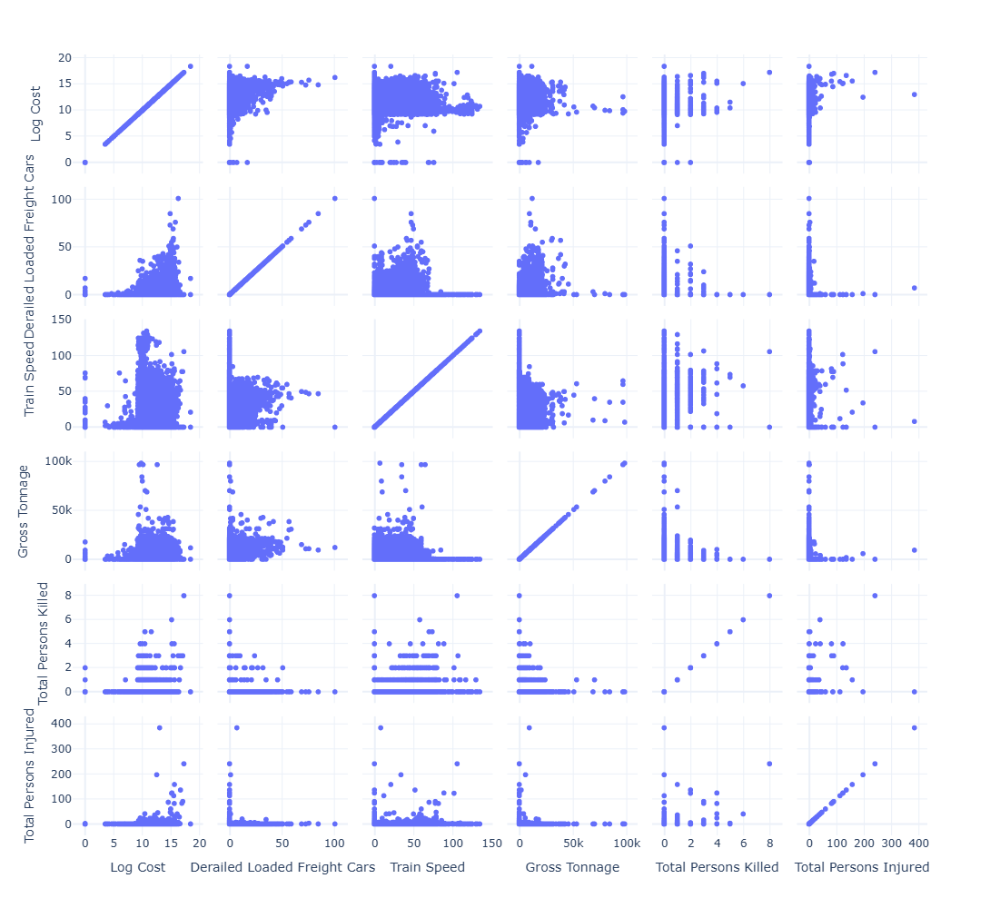

In [80]:
fig = px.scatter_matrix(df.loc[:, 
                ['Log Cost', 'Derailed Loaded Freight Cars', 'Train Speed', 'Gross Tonnage', 'Total Persons Killed', 'Total Persons Injured']])

fig.update_layout(
    height = 1000,
    width = 1000
)

fig.show()

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

np.random.seed(521)

features_subset = [
            'Accident Month', 'Hour',  'Temperature', 'Visibility Code', 'Weather Condition Code', 'Track Type Code', 
            'Train Speed', 'Gross Tonnage', 
            'Engineers On Duty', 'Firemen On Duty', 'Conductors On Duty', 'Brakemen On Duty',
            'Population_2020', 'RUCC_2023', 'Cause_Category',
            'Total Empty Cars', 'Total Engine Cars', 'Total Loaded Cars', 'Total Persons Killed', 'Total Persons Injured'
           ]

targets = ['Log Cost']

encoded_df = pd.get_dummies(df[features_subset + targets], columns = ['Cause_Category'], dtype = int).fillna(0)

scaler = StandardScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(encoded_df))

scaled_df.columns = encoded_df.columns

x_train, x_test, y_train, y_test = train_test_split(scaled_df.loc[:, scaled_df.columns != 'Log Cost'], scaled_df[targets], test_size = 0.2)

In [56]:
from sklearn.metrics import PredictionErrorDisplay
from sklearn.metrics import root_mean_squared_error, r2_score

def evaluate_model(model, x_train, y_train, x_test, y_test):
    reg = model.fit(x_train, y_train)

    y_pred = reg.predict(x_test)

    print('RMSE:', root_mean_squared_error(y_test, y_pred))
    print('R2:', r2_score(y_test, y_pred))
    
    _, ax = plt.subplots(figsize=(5, 5))
    error_display = PredictionErrorDisplay.from_predictions(
        y_test, y_pred, kind="actual_vs_predicted", ax=ax, scatter_kwargs={"alpha": 0.5}
    )
    plt.tight_layout()
    
    plt.show()
    
    res = pd.DataFrame({
        'Testing': y_test.values.T[0],
        'Prediction': y_pred.flatten()
    })
    
    fig = px.histogram(res, x = ['Testing', 'Prediction'], barmode = 'overlay')
    
    print()
    
    fig.show()

    return reg

RMSE: 0.9148296821316928
R2: 0.13404687049189679


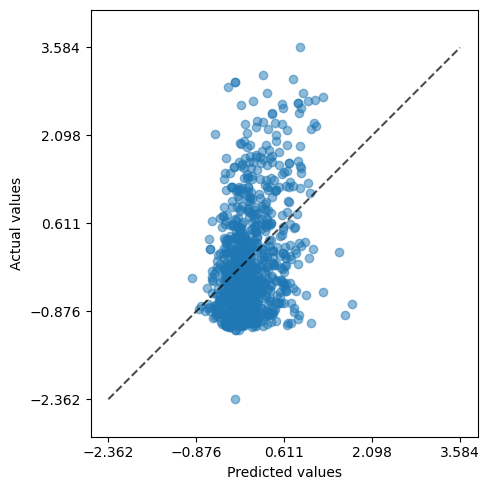

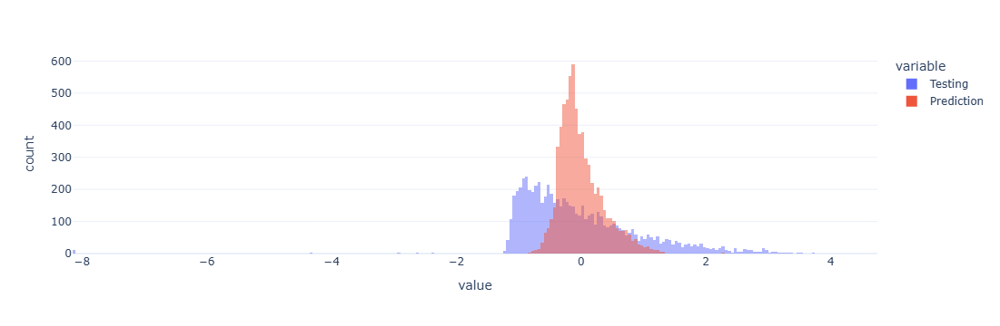

In [57]:
from sklearn.linear_model import LinearRegression

lr_model = evaluate_model(LinearRegression(), x_train, y_train, x_test, y_test)

RMSE: 0.928513336619887
R2: 0.10794797368967368


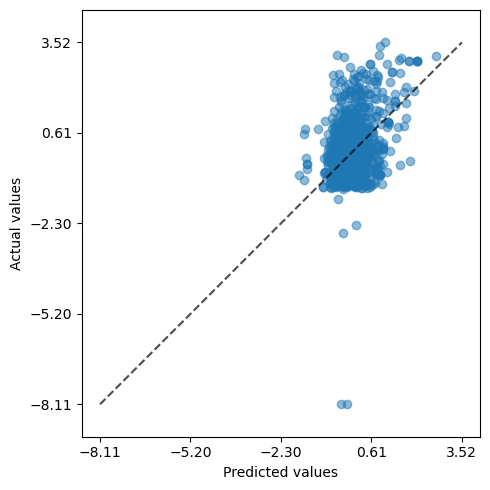

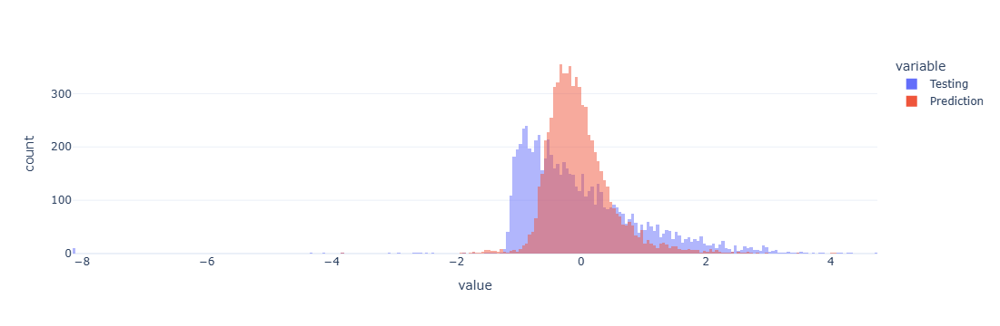

In [58]:
from sklearn.neighbors import KNeighborsRegressor

knn_model = evaluate_model(KNeighborsRegressor(n_neighbors = 7), x_train, y_train, x_test, y_test)

RMSE: 1.2545809961228356
R2: -0.628588266087768


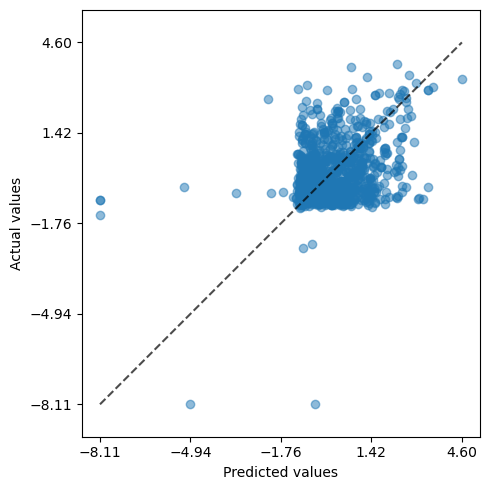

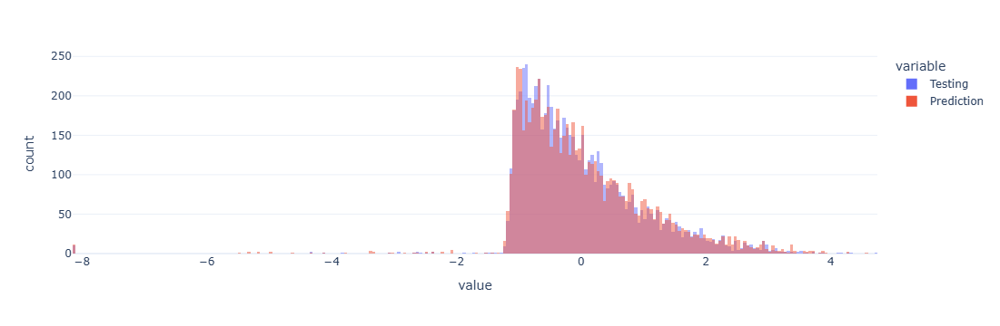

In [60]:
from sklearn.tree import DecisionTreeRegressor

tree_model = evaluate_model(DecisionTreeRegressor(), x_train, y_train, x_test, y_test)

C:\Users\albet\anaconda3\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RMSE: 0.8714591002774884
R2: 0.2142074432243285


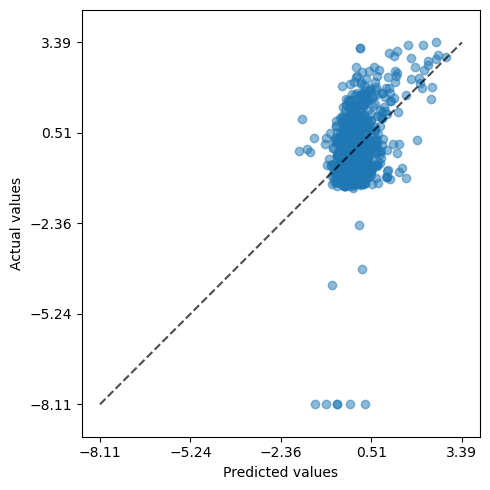

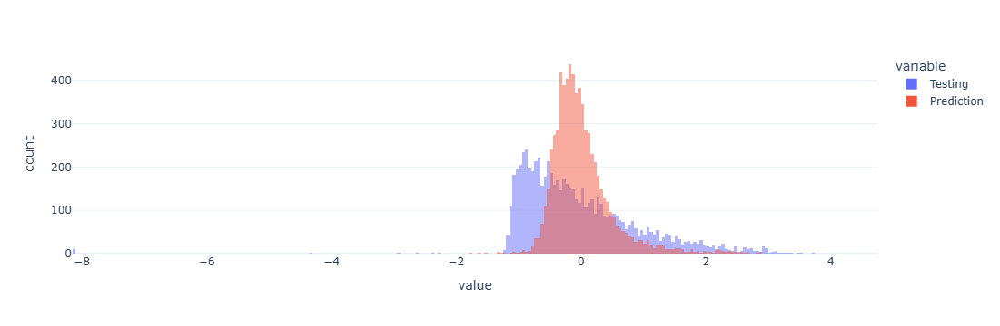

In [62]:
from sklearn.ensemble import RandomForestRegressor

forest_model = evaluate_model(RandomForestRegressor(), x_train, y_train, x_test, y_test)

C:\Users\albet\anaconda3\Lib\site-packages\sklearn\ensemble\_gb.py:668: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



RMSE: 0.8692751636987296
R2: 0.2181410087780412


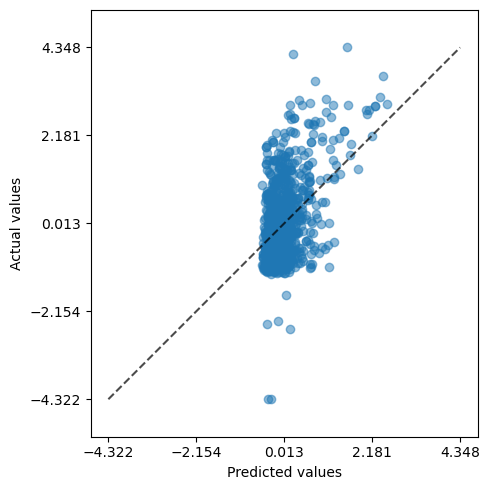

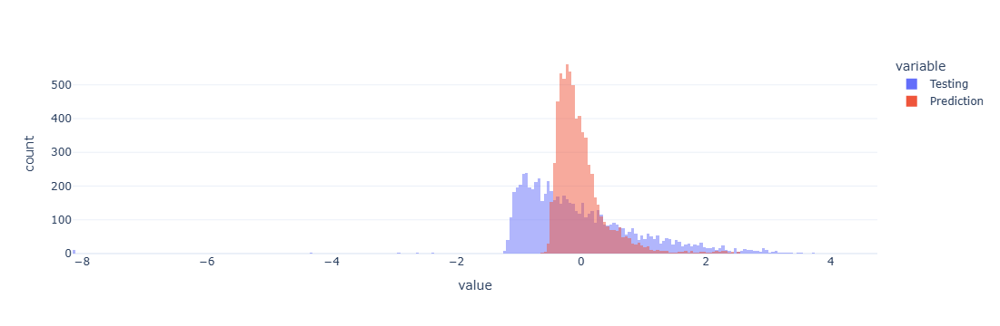

In [77]:
from sklearn.ensemble import GradientBoostingRegressor

gb_model = evaluate_model(GradientBoostingRegressor(), x_train, y_train, x_test, y_test)

In [ ]:
from sklearn.model_selection import GridSearchCV

gridsearch_forest = GridSearchCV(RandomForestRegressor(), {
    'n_estimators': [50, 100, 200],
    'max_features': [1, 3, 5],
    'max_depth': [5, None]
})

evaluate_model(gridsearch_forest, x_train, y_train.values.flatten(), x_test, y_test.values.flatten())